# Dimensionality Reduction Techniques on Python - 4

Welcome to the fourth and the last notebook on this notebook serie about Dimensionality Reduction. In this notebook we will performing two applications of Dimensionality Reduction. In the first one we will be using t-SNE and UMAP for visualizing genomic data. In the second one we will be using PCA, LDA and UMAP for improving classification accuracy. Let's get started.

# Visualizing Genomic Data via Dimensionality Reduction

Motivated by "The art of using t-SNE for single-cell transcriptomics" ([Single Cell RNA Seq from Stoeckius et al. 2017](https://www.kaggle.com/datasets/chrispr/single-cell-rna-seq-from-stoeckius-et-al-2017/code)) I will use regular t-SNE, FLT-tSNE, and UMAP on a genomic data. 

To reduce the length of this notebook on GitHub, I deleted the outputs of installations.

In [ ]:
!pip install kaleido

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import time
import plotly.io as pio
import kaleido
import plotly.express as px

In [ ]:
data = pd.read_csv('/content/GSE100866_CD8_merged-RNA_umi.csv', index_col = 0)

In [ ]:
data=data.T
data

,A2M-AS1,AACS,AAGAB,AAK1,AAMDC,AAMP,AAR2,AARS,AARS2,AARSD1,...,ZNF627,ZNF717,ZNF724P,ZNF776,ZNF778,ZNF823,ZNF850,ZSCAN21,ZXDB,hsa-mir-8072
CD8_off_GACCCCCCTTCT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CD8_off_CCTGCATATCTT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CD8_off_CCAAGATTGTGA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CD8_off_CTCCGGACAACC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CD8_off_CCACTTCCCTCT,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CD8_high_ACTTGGGAGTCC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CD8_high_ACTCTGACACCA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CD8_high_ACGCGCCTGATC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CD8_high_GCCACACCTGTG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


For visualization purposes, I will create 4 categories so that we can clearly label the data when we projected it to a lower dimension.

In [ ]:
y = pd.Series(dtype = 'object')
y.loc[1] = '1'

ind = data.index

y = pd.Series(dtype = 'object')

for i, t in enumerate(ind):
    if 'high' in t:
        y[t] = 'CD8_high'
    if 'off' in t:
        y[t] = 'CD8_off'
    if 'intermediate' in t:
        y[t] = 'CD8_intermediate'
    if 'low' in t:
        y[t] = 'CD8_low'

## Visualization of Genomic Data with t-SNE

Now I will define some values for `learning_rate`, `perplexity`, `early_exaggeration`, and `metric` parameters and randomly try out some of the values selected for the parameters that I define so that we can explore some different values and find a better low-dimensional representation. I will show the results in subplots and then I will plot one of the options in a bigger plot.

In [ ]:
lr=[100,200,300,500,800]
perp=[30,50,90,120,200]
ear_exag=[10,14,20,24,30]
dis=["chebyshev","euclidean","hamming","minkowski","cityblock","jaccard"]

In [ ]:
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DataConversionWarning)
warnings.filterwarnings("ignore", category=UserWarning)

I will start with t-SNE, and try out both PCA initialization and random initialization using different values that I defined above.

chebyshev distance is used...
euclidean distance is used...
hamming distance is used...
minkowski distance is used...
cityblock distance is used...
jaccard distance is used...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/

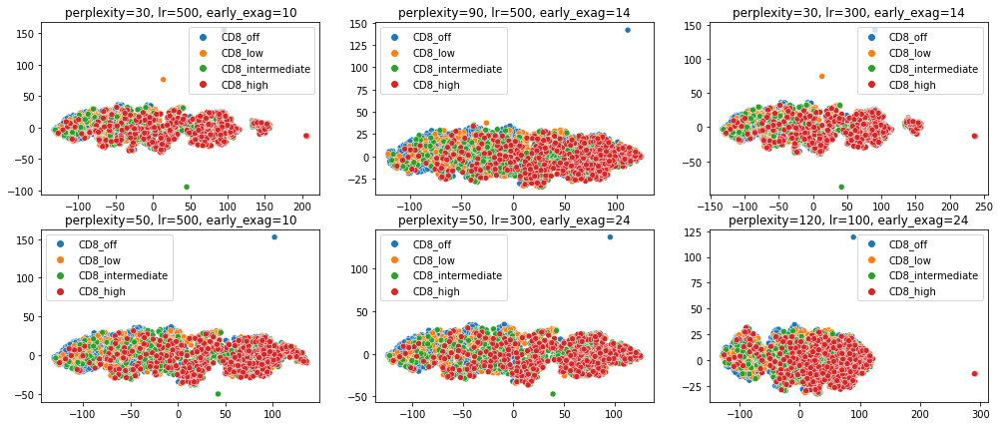

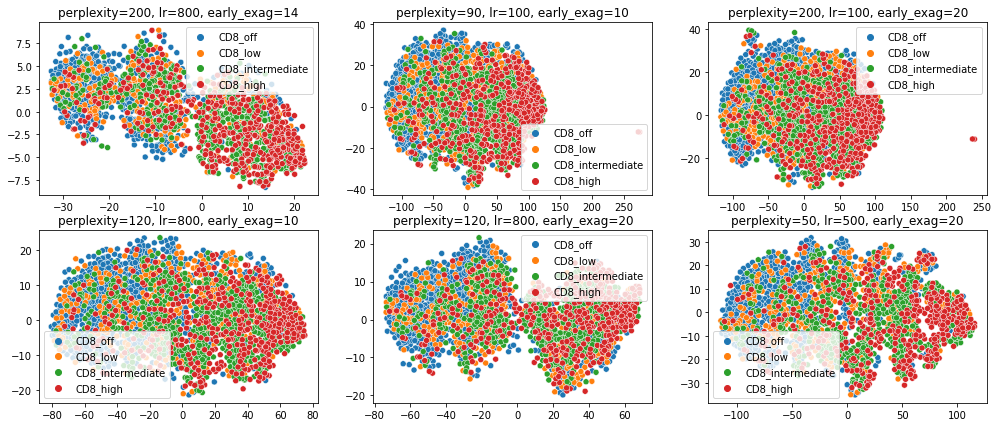

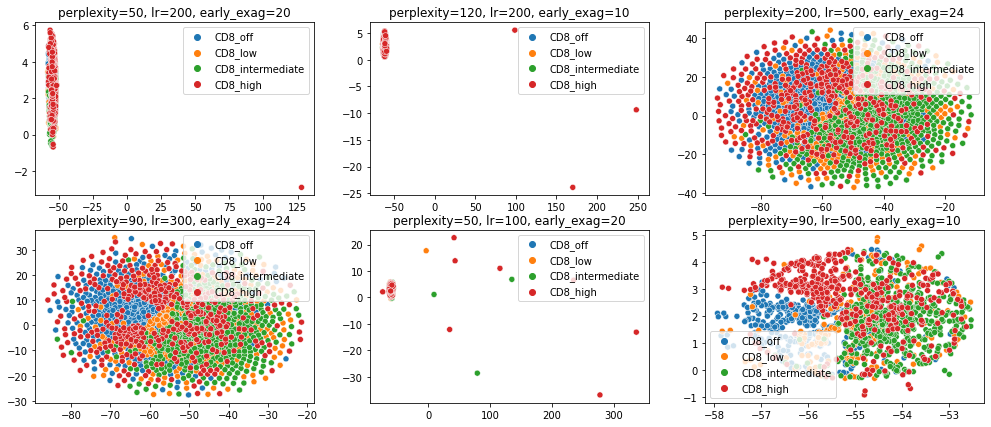

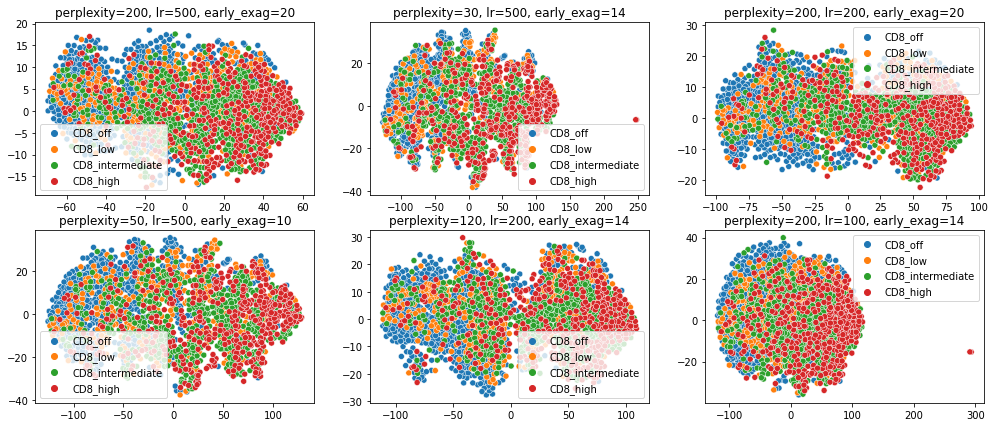

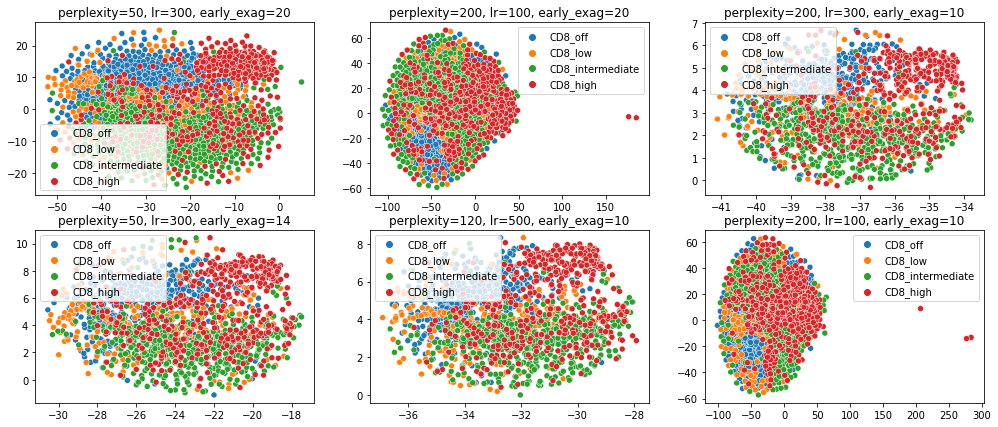

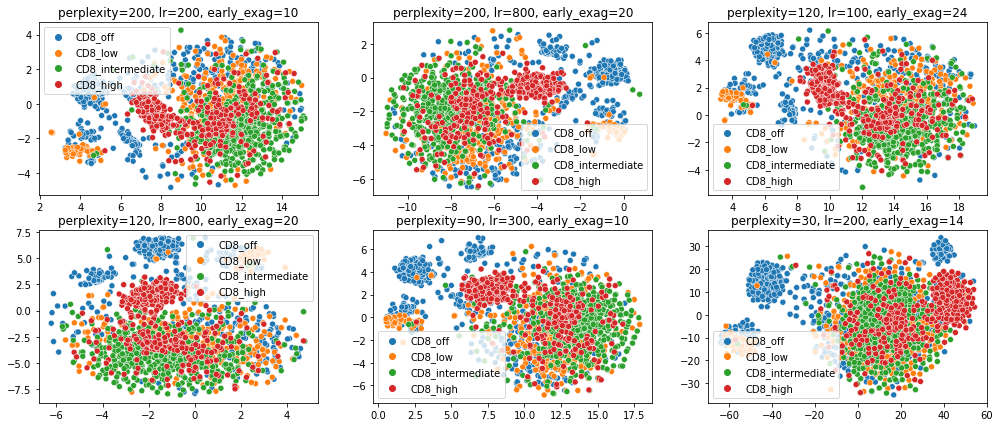

In [ ]:
from random import randint # t-SNE with PCA initialization
s=1
t0 = time.time()
for k in range(6):
    fig, axes = plt.subplots(2, 3, figsize=(17, 7))
    rand_dis=randint(0,5)
    print(str(dis[k])+" distance is used...")
    for i in range(2):
         for j in range(3):
            rand_lr=randint(0, 4)
            rand_perp=randint(0, 4)
            rand_ee=randint(0, 3)
             t_sne = TSNE(
            
            learning_rate=lr[rand_lr],
            perplexity=perp[rand_perp],
            n_iter=1000,
            init="pca",
            early_exaggeration=ear_exag[rand_ee],
            n_components=2,
            random_state=42,
            metric=dis[k])
       
            X_reduced=t_sne.fit_transform(data)
            sns.scatterplot(x=X_reduced[:, 0], y=X_reduced[:, 1], hue=y,ax=axes[i,j])
            axes[i,j].set_title("perplexity="+str(perp[rand_perp])+", lr="+str(lr[rand_lr])+", early_exag="+str(ear_exag[rand_ee]),fontsize=12)
overall_pca=time.time()-t0



Let's see how long it took to find all these low-dimensional representation

In [ ]:
overall_pca # around 20 minutes...

1125.7834374904633

Let's also do the same thing except that we will use random initialization this time.

chebyshev distance is used...
euclidean distance is used...
hamming distance is used...
minkowski distance is used...
cityblock distance is used...
jaccard distance is used...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1875: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/

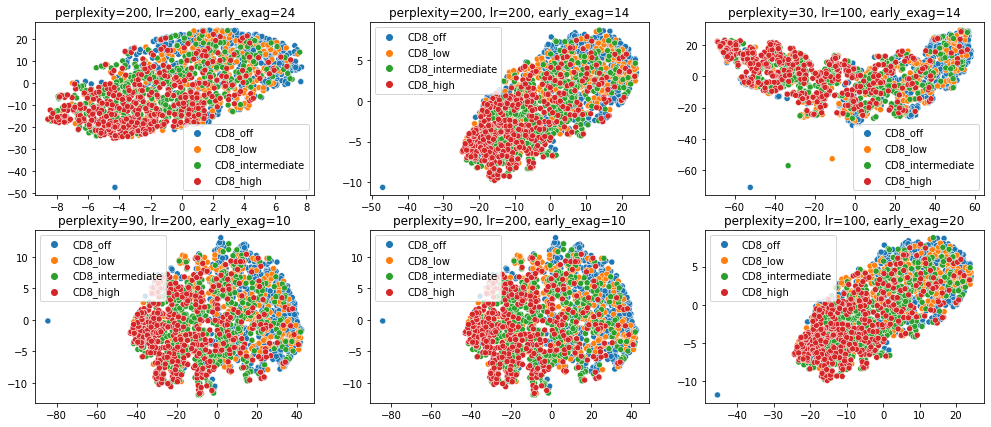

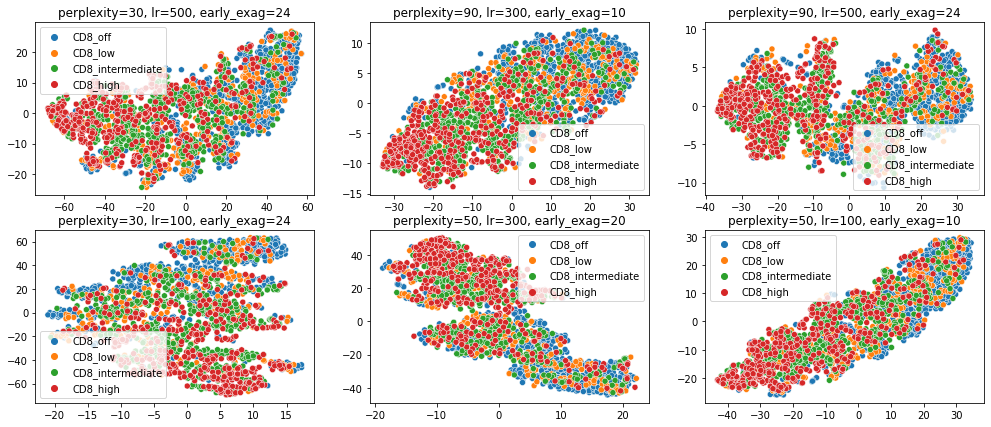

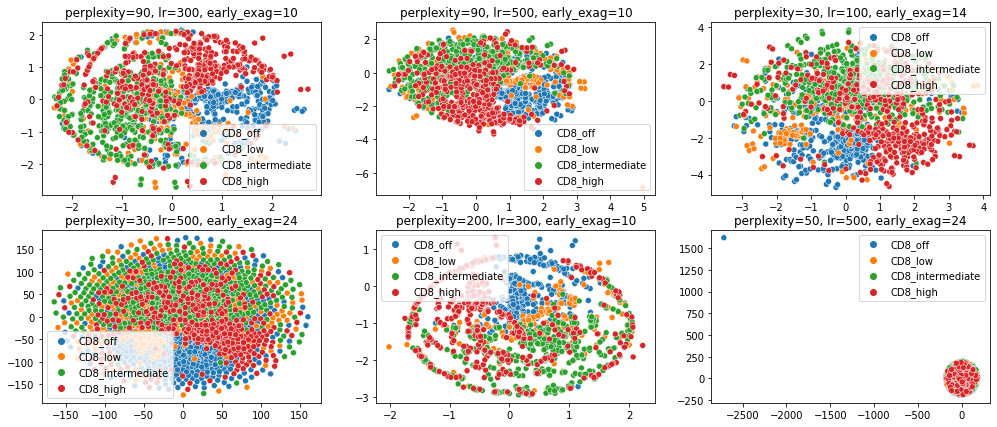

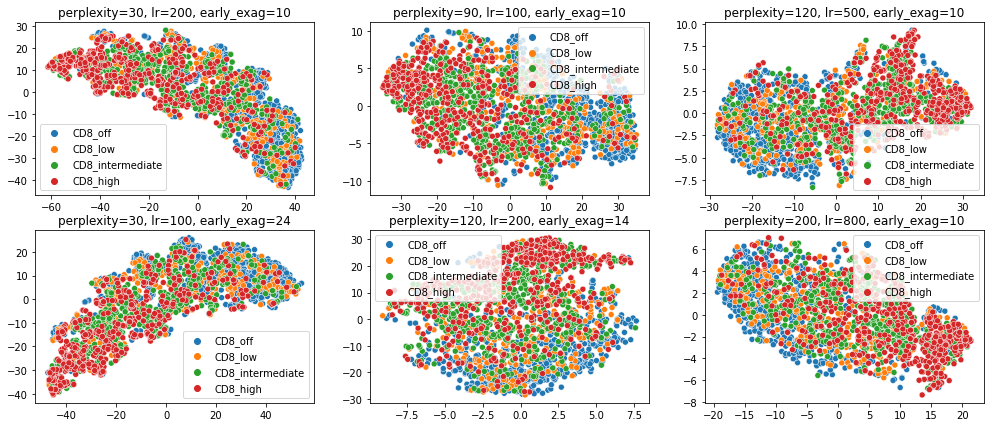

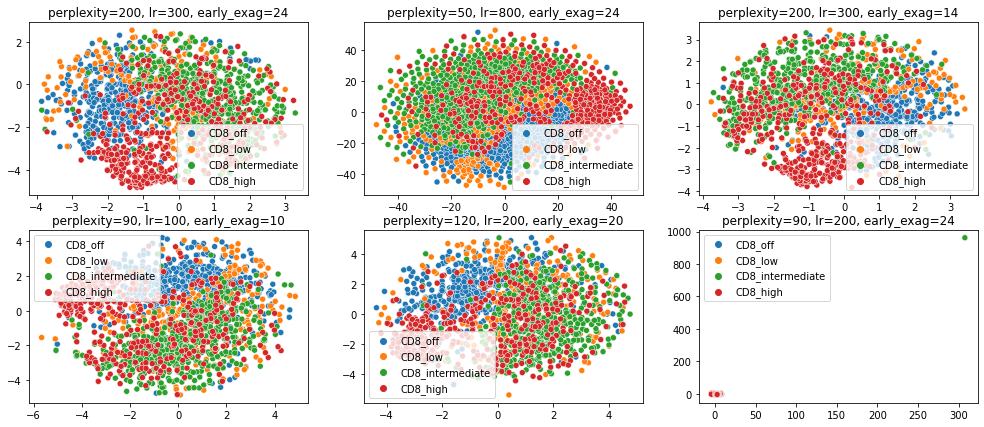

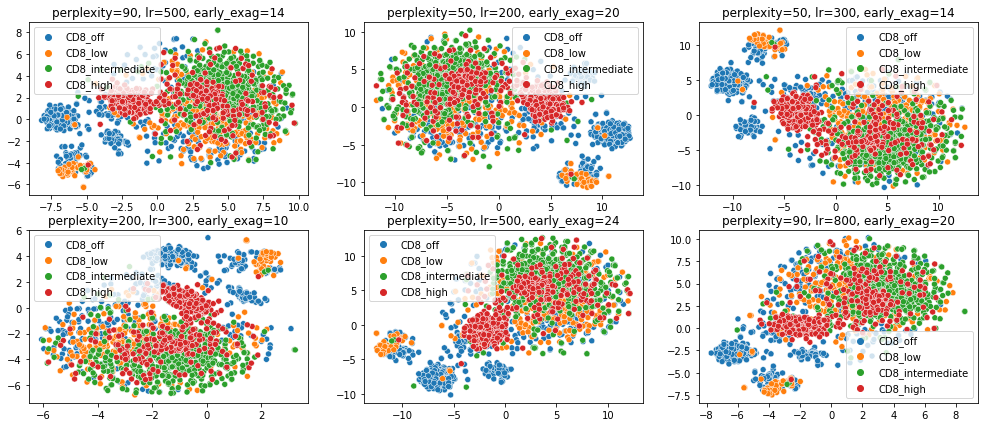

In [ ]:
from random import randint # t-SNE with Random initialization
s=1
t0 = time.time()
for k in range(6):
    
    fig, axes = plt.subplots(2, 3, figsize=(17, 7))
    rand_dis=randint(0,5)
    print(str(dis[k])+" distance is used...")
    for i in range(2):        
            for j in range(3):
                rand_lr=randint(0, 4)
                rand_perp=randint(0, 4)
                rand_ee=randint(0, 3)
                t_sne = TSNE(
            learning_rate=lr[rand_lr],
            perplexity=perp[rand_perp],
            n_iter=1000,
            init="random",
            early_exaggeration=ear_exag[rand_ee],
            n_components=2,
            random_state=42,
            metric=dis[k])
            X_reduced=t_sne.fit_transform(data)
            sns.scatterplot(x=X_reduced[:, 0], y=X_reduced[:, 1], hue=y,ax=axes[i,j])
            axes[i,j].set_title("perplexity="+str(perp[rand_perp])+", lr="+str(lr[rand_lr])+", early_exag="+str(ear_exag[rand_ee]),fontsize=12)
overall_random=time.time()-t0



In [ ]:
overall_random

948.8110723495483

Looks like Random initialization saved some time of us compared to PCA initialization. Let's also plot two of the plots returned from the parameter search in a bigger figure.

34.82074809074402


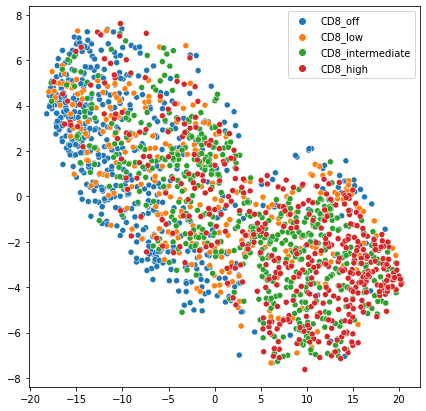

In [ ]:
t0 = time.time()
t_sne_rand = TSNE(learning_rate=200, perplexity=200, n_iter=1000,
            init="random", early_exaggeration=20, n_components=2, random_state=42, metric="minkowski")

X_reduced_rand=t_sne_rand.fit_transform(data)

plt.figure(figsize=(7, 7))
sns.scatterplot(X_reduced_rand[:, 0], X_reduced_rand[:, 1], hue=y)
print(time.time()-t0)

51.40089416503906


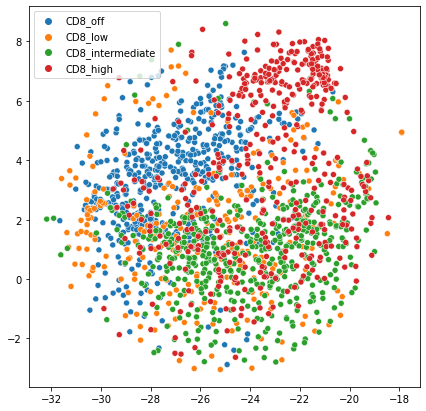

In [ ]:
t0 = time.time()
t_sne_pca = TSNE(learning_rate=300, perplexity=50, n_iter=1000,
            init="pca", early_exaggeration=20, n_components=2, random_state=42, metric="cityblock")

X_reduced_pca=t_sne_pca.fit_transform(data)

plt.figure(figsize=(7, 7))
sns.scatterplot(x=X_reduced_pca[:, 0], y=X_reduced_pca[:, 1], hue=y)
print(time.time()-t0)

Let's also reduce the dimensionality to 3 dimensions using some of the values that we used in the plots above and show the low-dimensional representation.

In [ ]:
pio.renderers

Renderers configuration
-----------------------
    Default renderer: 'colab'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']

I will be using interactive plots of Plotly, however, these plots are not available in offline mode. Therefore, I will be rendering the plots as png to show them in offline mode. You can change png to other suitable values such as colab and run the code to use the plot interactively.

In [ ]:
def tsne_3d(lr,perp,init,ear_exag,metric,rend):
    
    t_sne_rand = TSNE(learning_rate=lr, perplexity=perp, n_iter=1000,
            init="random", early_exaggeration=ear_exag, n_components=3, random_state=42, metric=metric)

    X_reduced_rand=t_sne_rand.fit_transform(data)

    plt.figure(figsize=(10, 7))

    scatter_3d = px.scatter_3d(x=X_reduced_rand[:, 0], y=X_reduced_rand[:, 1], z=X_reduced_rand[:, 2], color=y, opacity=0.7,size_max=10)
    scatter_3d.update_layout(autosize=False, width=700, height=700, legend_title="CD8 Levels", showlegend=True,
                            scene=dict(xaxis=dict(title='Component 1'),yaxis=dict(title='Component 2'),zaxis=dict(title='Component 3')))
    scatter_3d.show(renderer=rend) 

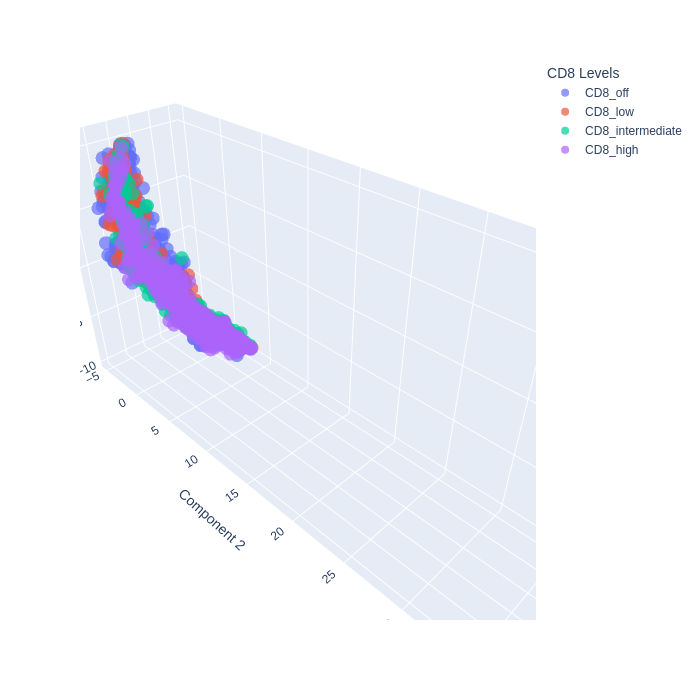

<Figure size 720x504 with 0 Axes>

In [ ]:
tsne_3d(200,200,"random",20,"minkowski","png")

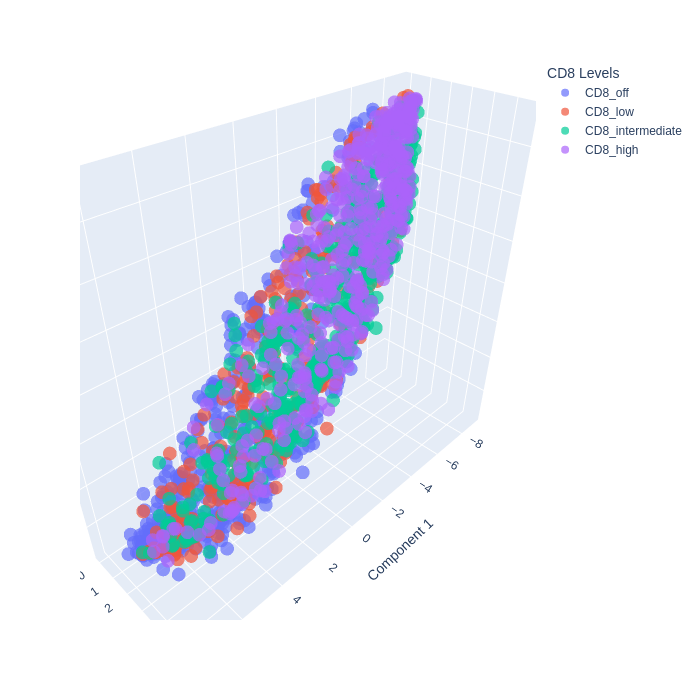

<Figure size 720x504 with 0 Axes>

In [ ]:
tsne_3d(300,200,"pca",10,"euclidean","png")

Let's move to using Flt-SNE and see whether it will make things faster.

## Visualization of Genomic Data with Fast t-SNE

Let's do the same steps that we performed above, using Fast t-SNE.

In [ ]:
!git clone https://github.com/KlugerLab/FIt-SNE.git
!wget http://www.fftw.org/fftw-3.3.10.tar.gz
!tar -xf fftw-3.3.10.tar.gz
!cd fftw-3.3.10
!./fftw-3.3.10/configure
!make
!make install
!g++ -std=c++11 -O3  FIt-SNE/src/sptree.cpp FIt-SNE/src/tsne.cpp FIt-SNE/src/nbodyfft.cpp  -o FIt-SNE/bin/fast_tsne -pthread -lfftw3 -lm -Wno-address-of-packed-member
import sys; sys.path.append('FIt-SNE/')

In [ ]:
from fast_tsne import fast_tsne

In [ ]:
lr=[100,200,300,500,800]
perp=[30,50,90,120,200]
ear_exag=[10,14,20,24,30]

flt-SNE does not provide using different initialization methods and using different distance functions. Therefore, we will do a quick parameter search for learning_rate, perplexity and early_exaggation.

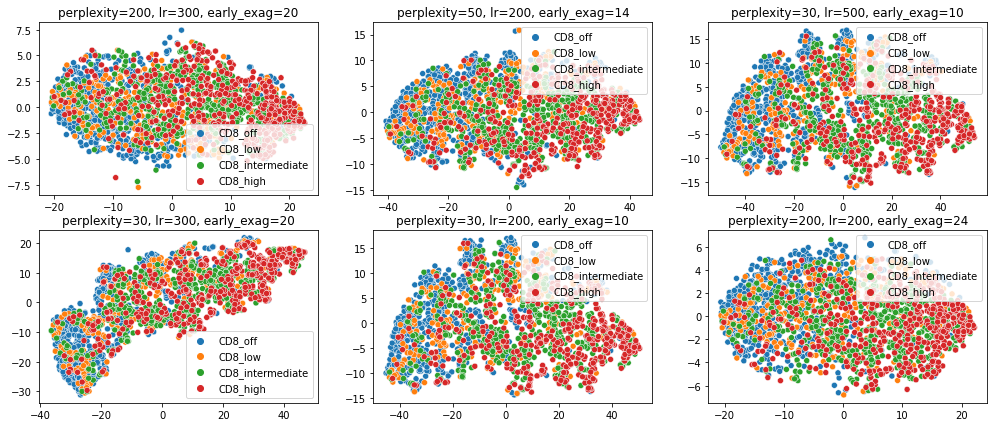

In [ ]:
from random import randint
s=1
t0 = time.time()
fig, axes = plt.subplots(2, 3, figsize=(17, 7))
for i in range(2):
    for j in range(3):
        rand_lr=randint(0, 4)
        rand_perp=randint(0, 4)
        rand_ee=randint(0, 3)
        fft_tsne = fast_tsne(data, perplexity=perp[rand_perp], learning_rate=lr[rand_lr], early_exag_coeff=ear_exag[rand_ee], seed=42,map_dims=2)

        sns.scatterplot(x=fft_tsne[:, 0], y=fft_tsne[:, 1], hue=y,ax=axes[i,j])
        axes[i,j].set_title("perplexity="+str(perp[rand_perp])+", lr="+str(lr[rand_lr])+", early_exag="+str(ear_exag[rand_ee]),fontsize=12)
overall_random=time.time()-t0



In [ ]:
overall_random

261.15206384658813

38.99300408363342


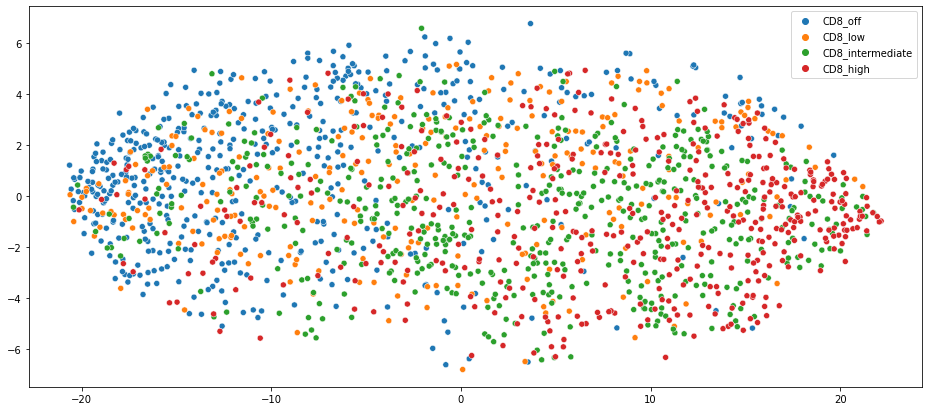

In [ ]:
t0 = time.time()
fft_tsne = fast_tsne(data, perplexity=200, learning_rate=200, early_exag_coeff=24, seed=42, map_dims=2)
plt.figure(figsize=(16, 7))
sns.scatterplot(fft_tsne[:, 0], fft_tsne[:, 1], hue=y)
print(time.time()-t0)

Unfortunately, we will not be able to use FFT t-SNE for mapping the data in three dimensions, because the algorithm only supports mapping to 1D and 2D. On the other hand, here I'd like to mention that the creators of UMAP also provide a library named openTSNE which can be used with both the Barnes Hut algorithm and the FFT interpolation. Check out its documentation [openTSNE](https://opentsne.readthedocs.io/en/latest/installation.html)

# Visualization of Genomic Data with UMAP

Lastly, let's also use UMAP for visualizing the data in two and three dimensions.

In [ ]:
!pip install umap-learn

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import umap

Let's define the parameters and values that we will search through.

In [ ]:
lr=[0.7,1,2,3,5] # default = 1
n_neighbors=[5,10,15,20,30] # default = 15
min_dist=[0.1,0.2,0.3,0.4,0.6] # default = 0.1
dis=["braycurtis","chebyshev","euclidean","hamming","minkowski","jaccard"] # default = euclidean

braycurtis distance is used...
chebyshev distance is used...
euclidean distance is used...
hamming distance is used...


/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function

minkowski distance is used...
jaccard distance is used...


/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function

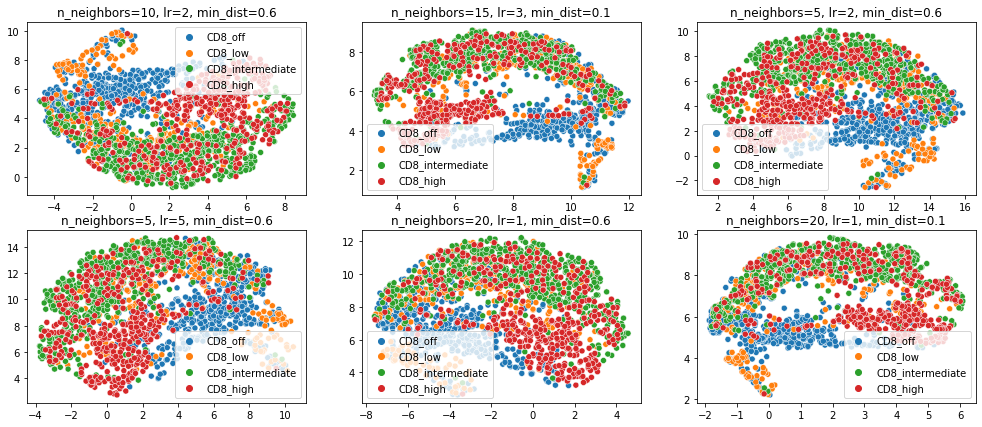

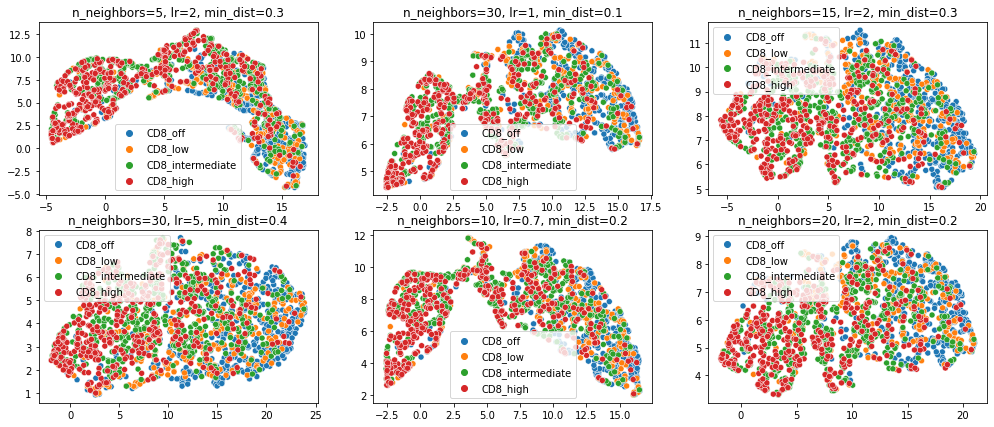

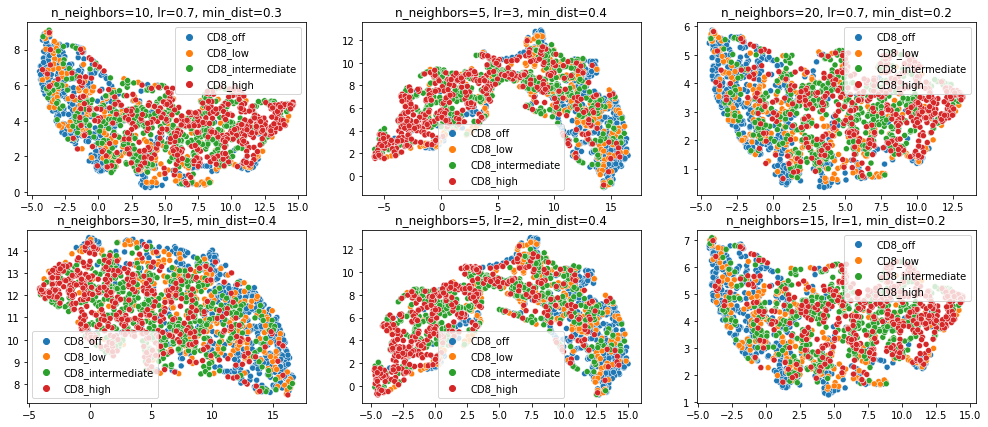

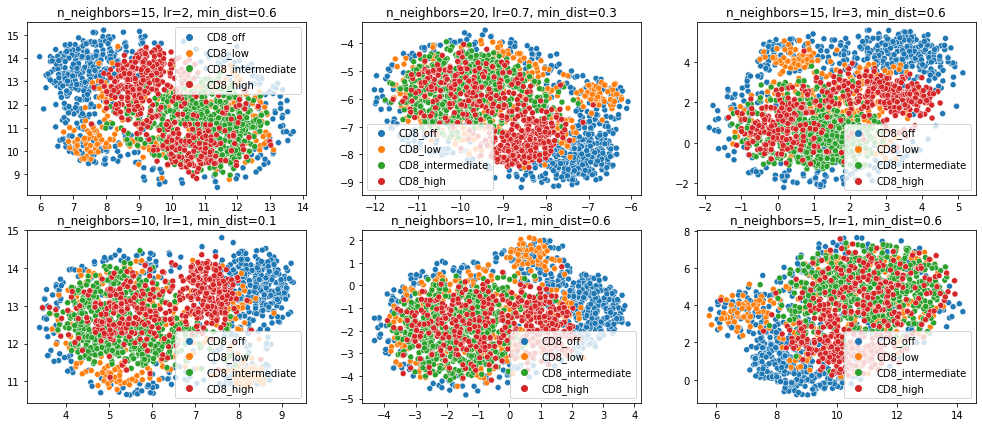

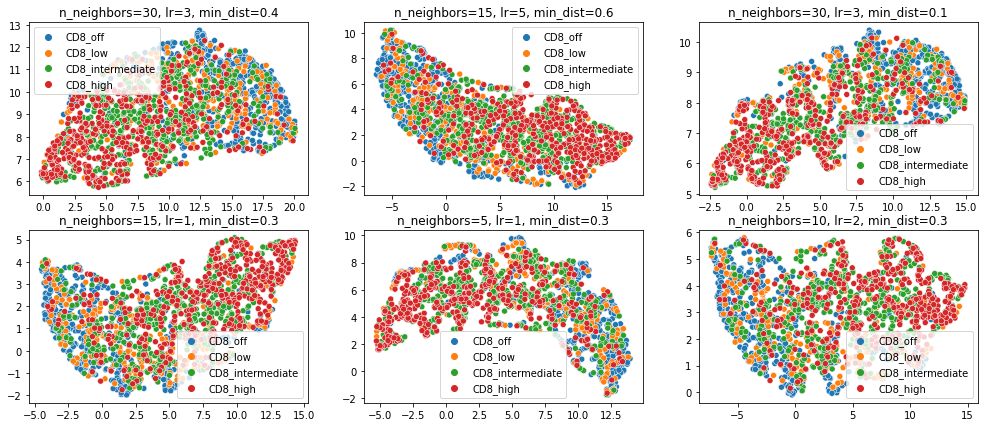

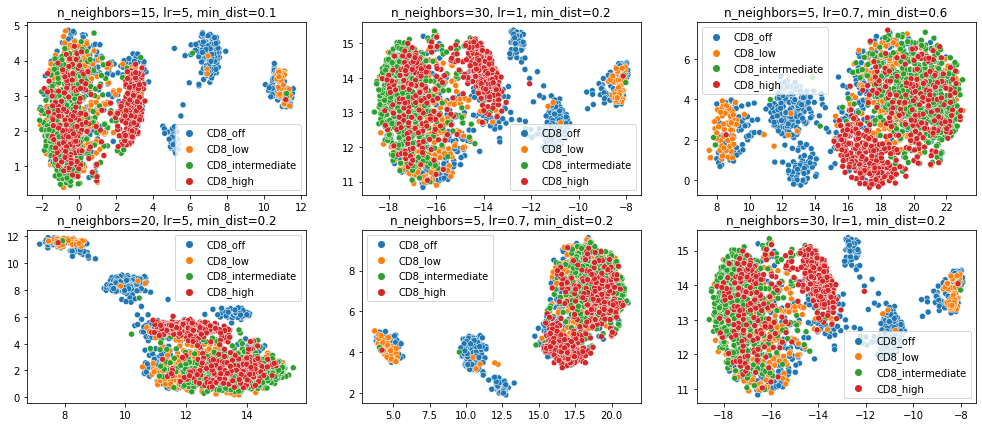

In [ ]:
from random import randint
s=1
t0 = time.time()
for k in range(6):
    
    fig, axes = plt.subplots(2, 3, figsize=(17, 7))
    rand_dis=randint(0,5)
    print(str(dis[k])+" distance is used...")
    for i in range(2):
        for j in range(3):
            rand_lr=randint(0, 4)
            rand_perp=randint(0, 4)
            rand_ee=randint(0, 4)
         
            UMAP = umap.UMAP(n_neighbors=n_neighbors[rand_perp], min_dist=min_dist[rand_ee], metric=dis[k], learning_rate=lr[rand_lr], random_state=42)

            X_reduced = UMAP.fit_transform(data)
            sns.scatterplot(x=X_reduced[:, 0], y=X_reduced[:, 1], hue=y,ax=axes[i,j])
            axes[i,j].set_title("n_neighbors="+str(n_neighbors[rand_perp])+", lr="+str(lr[rand_lr])+", min_dist="+str(min_dist[rand_ee]), fontsize=12)
overall_random=time.time()-t0

31.82401728630066


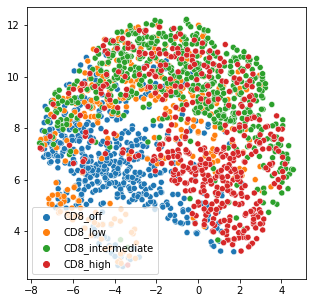

In [ ]:
t0 = time.time()
X_reduced = umap.UMAP(n_neighbors=20, min_dist=0.6, metric="braycurtis", learning_rate=1, random_state=42).fit_transform(data)
plt.figure(figsize=(5, 5))
sns.scatterplot(X_reduced[:, 0], X_reduced[:, 1], hue=y)
print(time.time()-t0)

Let's also use UMAP plots and see what the connectivity looks like.

In [ ]:
!pip install umap-learn[plot]
!pip install holoviews

In [ ]:
import umap.plot

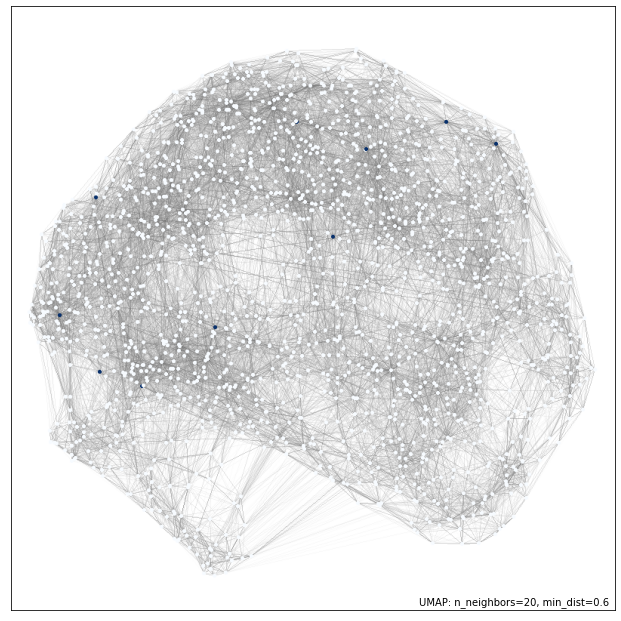

In [ ]:
X_reduced_embedding = umap.UMAP(n_neighbors=20, min_dist=0.6, metric="braycurtis", learning_rate=1, random_state=42).fit(data)
umap.plot.connectivity(X_reduced_embedding, show_points=True)

/usr/local/lib/python3.7/dist-packages/umap/plot.py:886: UserWarning:

Hammer edge bundling is expensive for large graphs!
This may take a long time to compute!



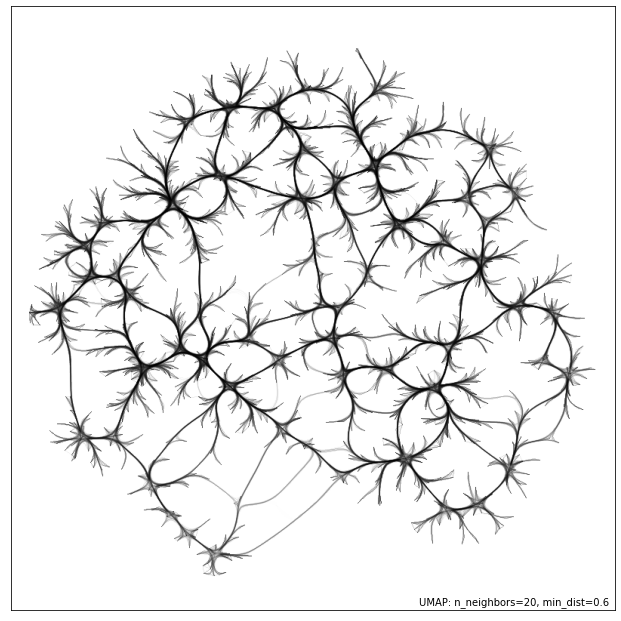

In [ ]:
umap.plot.connectivity(X_reduced_embedding, edge_bundling='hammer')

Let's also use UMAP for embedding the data in three dimensions and plot it.

In [ ]:
def umap_3d(lr,perp,min_dist,metric,rend):
    X_reduced = umap.UMAP(n_neighbors=perp, min_dist=min_dist, metric=metric, learning_rate=lr, n_components=3, random_state=42).fit_transform(data)

    plt.figure(figsize=(10, 7))

    scatter_3d = px.scatter_3d(x=X_reduced[:, 0], y=X_reduced[:, 1], z=X_reduced[:, 2], color=y, opacity=0.7,size_max=10)
    scatter_3d.update_layout(autosize=False, width=700, height=700, legend_title="CD8 Levels", showlegend=True,
                            scene=dict(xaxis=dict(title='Component 1'),yaxis=dict(title='Component 2'),zaxis=dict(title='Component 3')))
    scatter_3d.show(renderer=rend)

/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning:

gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable



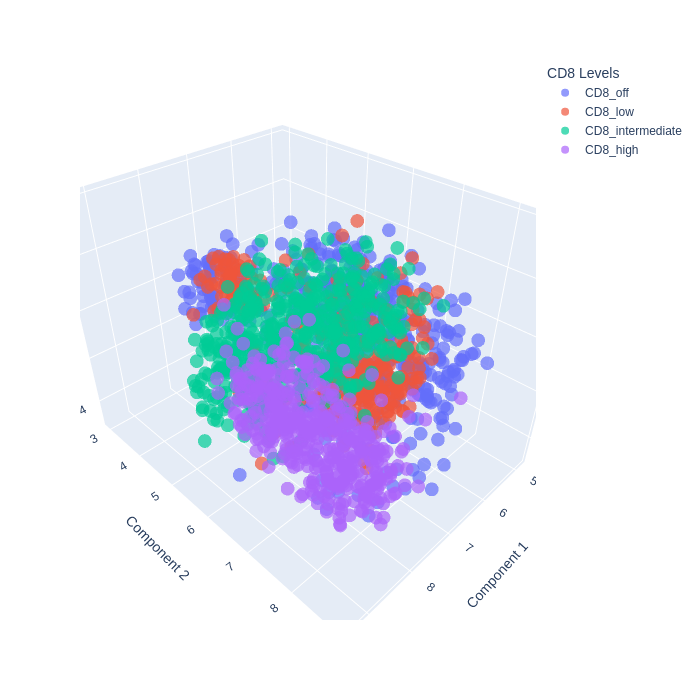

<Figure size 720x504 with 0 Axes>

In [ ]:
umap_3d(5,10,0.4,"hamming","png")

## Dimensionality Reduction for Saving Time

Now we will do another exercise which will be briefer than the first one. Here we will perform PCA and LLE on electricity data and then train three different Support Vector Machine Classifiers on not only the data we performed dimensionality reduction but also on the main data. Afterward, we will compare the metrics.

In [1]:
import seaborn as sns
import numpy as np
import pandas as pd
import time
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.datasets import fetch_openml
from sklearn.svm import NuSVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
sns.set_theme()

In [2]:
electricity = fetch_openml('electricity', version=1, as_frame=True)# let's load MNIST Numbers 

X = electricity["data"]
y = electricity["target"]

Let's start with a quick exploration on data.

In [3]:
print(electricity.DESCR) 

**Author**: M. Harries, J. Gama, A. Bifet  
**Source**: [Joao Gama](http://www.inescporto.pt/~jgama/ales/ales_5.html) - 2009  
**Please cite**: None  

**Electricity** is a widely used dataset described by M. Harries and analyzed by J. Gama (see papers below). This data was collected from the Australian New South Wales Electricity Market. In this market, prices are not fixed and are affected by demand and supply of the market. They are set every five minutes. Electricity transfers to/from the neighboring state of Victoria were done to alleviate fluctuations.

The dataset (originally named ELEC2) contains 45,312 instances dated from 7 May 1996 to 5 December 1998. Each example of the dataset refers to a period of 30 minutes, i.e. there are 48 instances for each time period of one day. Each example on the dataset has 5 fields, the day of week, the time stamp, the New South Wales electricity demand, the Victoria electricity demand, the scheduled electricity transfer between states and the 

In [4]:
X.describe()

,date,period,nswprice,nswdemand,vicprice,vicdemand,transfer
count,45312.000000,45312.000000,45312.000000,45312.000000,45312.000000,45312.000000,45312.000000
mean,0.499080,0.500000,0.057868,0.425418,0.003467,0.422915,0.500526
std,0.340308,0.294756,0.039991,0.163323,0.010213,0.120965,0.153373
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.031934,0.250000,0.035127,0.309134,0.002277,0.372346,0.414912
50%,0.456329,0.500000,0.048652,0.443693,0.003467,0.422915,0.414912
75%,0.880547,0.750000,0.074336,0.536001,0.003467,0.469252,0.605702
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
X

,date,day,period,nswprice,nswdemand,vicprice,vicdemand,transfer
0,0.0000,2,0.000000,0.056443,0.439155,0.003467,0.422915,0.414912
1,0.0000,2,0.021277,0.051699,0.415055,0.003467,0.422915,0.414912
2,0.0000,2,0.042553,0.051489,0.385004,0.003467,0.422915,0.414912
3,0.0000,2,0.063830,0.045485,0.314639,0.003467,0.422915,0.414912
4,0.0000,2,0.085106,0.042482,0.251116,0.003467,0.422915,0.414912
...,...,...,...,...,...,...,...,...
45307,0.9158,7,0.914894,0.044224,0.340672,0.003033,0.255049,0.405263
45308,0.9158,7,0.936170,0.044884,0.355549,0.003072,0.241326,0.420614
45309,0.9158,7,0.957447,0.043593,0.340970,0.002983,0.247799,0.362281
45310,0.9158,7,0.978723,0.066651,0.329366,0.004630,0.345417,0.206579


In [6]:
y

0          UP
1          UP
2          UP
3          UP
4        DOWN
         ... 
45307    DOWN
45308    DOWN
45309    DOWN
45310      UP
45311    DOWN
Name: class, Length: 45312, dtype: category
Categories (2, object): ['UP', 'DOWN']

In [7]:
bool_series = pd.isnull(X).sum()
bool_series

date         0
day          0
period       0
nswprice     0
nswdemand    0
vicprice     0
vicdemand    0
transfer     0
dtype: int64

Predictors are already normalized, so we don't need to use `StandardScaler()` but we need to encode the target feature. Let's also check if there is class imbalance.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


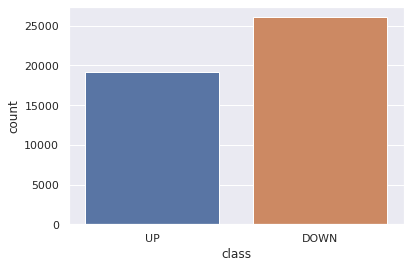

In [8]:
sns.countplot(y)

Let's encode the target and create train/test splits.

In [9]:
le=LabelEncoder()
target=le.fit_transform(y)
target

array([1, 1, 1, ..., 0, 1, 0])

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X,target,test_size = 0.2, random_state = 42,stratify = target)

I will use `NuSVC` for our exercise here and use `RandomizedSearchCV` for hyperparameter tuning.

In [11]:
nusvc=NuSVC()

In [12]:
params = {
    'nu':[0.25,0.50,0.75],
    'kernel': ["linear","rbf"],
    'gamma': ["scale","auto"],
}

In [13]:
rscv=RandomizedSearchCV(NuSVC(), params, cv=5,verbose=42,scoring="accuracy")

In [14]:
begin=[]
end=[]
accuracy=[]
f1=[]

In [ ]:
begin.append(time.time())
model_full=rscv.fit(X_train,y_train)
end.append(time.time())

In [16]:
accuracy.append(accuracy_score(model_full.predict(X_test),y_test))

In [17]:
f1.append(f1_score(model_full.predict(X_test),y_test))

Let's now apply PCA on the data and then train the model again.

In [18]:
from sklearn.decomposition import PCA
pca = PCA(n_components=0.95)# we would like to keep %95 of variance.
X2Comp= pca.fit_transform(X)

In [19]:
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X2Comp,target,test_size = 0.2, random_state = 42,stratify = target)

In [ ]:
import time
begin.append(time.time())
model_pca=rscv.fit(X_train_pca,y_train_pca)
end.append(time.time())

In [21]:
accuracy.append(accuracy_score(model_pca.predict(X_test_pca),y_test_pca))

In [22]:
f1.append(f1_score(model_pca.predict(X_test_pca),y_test_pca))

Now let's perform the same steps after applying LLE on the data.

In [ ]:
from sklearn.manifold import LocallyLinearEmbedding
LLE=LocallyLinearEmbedding(n_neighbors=10,eigen_solver="arpack",method="standard",neighbors_algorithm="brute")
X_reduced=LLE.fit_transform(X)
X_train_LLE, X_test_LLE, y_train_LLE, y_test_LLE = train_test_split(X_reduced,target,test_size = 0.2, random_state = 42,stratify = target)

In [ ]:
begin.append(time.time())
model_LLE=rscv.fit(X_train_LLE,y_train_LLE)
end.append(time.time())

In [ ]:
accuracy.append(accuracy_score(model_LLE.predict(X_test_LLE),y_test_LLE))
f1.append(f1_score(model_LLE.predict(X_test_LLE),y_test_LLE))

In [27]:
data = {'Accuracy': [accuracy[0],accuracy[1],accuracy[2]],
        'F1 Score': [f1[0],f1[1],f1[2]],
        'Time': [end[0]-begin[0],end[1]-begin[1],end[2]-begin[2]]}

results = pd.DataFrame(data,index=['No DR','PCA','LLE'])
results

,Accuracy,F1 Score,Time
No DR,0.773254,0.722260,2324.179117
PCA,0.536026,0.495501,1160.077008
LLE,0.457464,0.549271,1287.237288


Dimensionality Reduction has saved a lot of time in terms of training, however, it also affected the algorithm's performance a lot. It is important to take this note that these results shouldn't be perceived as dimensionality reduction causes the algorithms to perform worse. The results can be changeable according to which algorithm/dataset/dimensionality reduction technique you prefer to use. As always, NO FREE LUNCH. 